# Analisi tra i picchi delle variazioni positive e negative degli NFT e la sentimental analysis

### Import libraries and dataframes

In [37]:
import pandas as pd
from datetime import datetime, timedelta
from matplotlib.dates import DateFormatter, DayLocator
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.dates as mdates
from sklearn.preprocessing import MinMaxScaler
import mplcursors
import plotly.express as px
from datetime import datetime
from tabulate import tabulate


 Ho poi trovato tutti i tweet che sono stati fatti 3 giorni prima di ogni picco (positivo e negativo). Poi mi sono calcolato due soglie (pos e neg) (sono andato a tentativi per trovare i tweet più influenti, parlare di questa cosa) sul punteggio_totale.

Es. se un tweet positivo ha una soglia di punteggio più alto di una allora sarà stato influente sennò non tanto.

quindi mi sono trovato i tweet dove il punteggio_totale era più alto e ho stampato (la stampa è molto esplicativa) (qui probabilemte c'è un errore perche i risultati sono giusto ma hanno duplicati quindi boh).

Poi ho aggiunto (collegando il dataset delle collezioni 'tweets_collection') a questi tweet che avevo trovato.

Infine mi sono salvato il dataframe dei tweet più influenti che probabilemte hanno fatto aumentare il prezzo degli nft.

In [38]:
# Caricamento dei dataset
top_nft_positivi = pd.read_csv("../dataframes/top_nft_positivi_df.csv")
top_nft_negativi = pd.read_csv("../dataframes/top_nft_negativi_df.csv")
tweets_sentiment = pd.read_csv("../dataframes/tweets_sentiment_df.csv") 
tweets_collection = pd.read_csv("../datasets/twitter/twitter_tweet_collection.csv")


# Converti le colonne delle date in formato datetime
top_nft_positivi['data_inizio'] = pd.to_datetime(top_nft_positivi['data_inizio'])
top_nft_negativi['data_inizio'] = pd.to_datetime(top_nft_negativi['data_inizio'])
tweets_sentiment['created_at'] = pd.to_datetime(tweets_sentiment['created_at'])

In [39]:
#print(top_nft_positivi.columns)
#print(top_nft_negativi.columns)
#print(tweets_sentiment.columns)

## Analisi top nft positivi

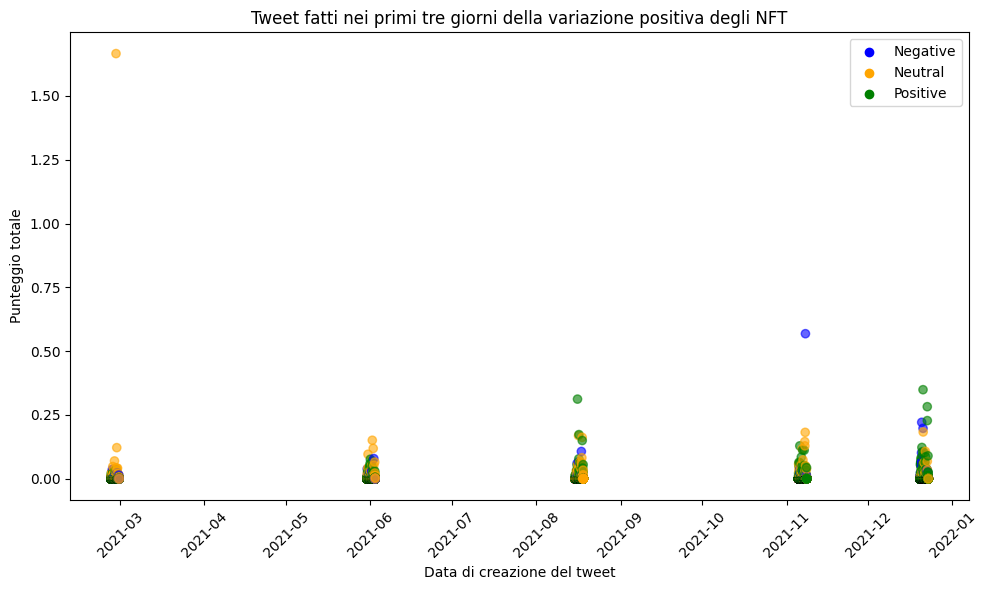

In [40]:
# Preparazione per il filtraggio dei tweet
tweets_nei_primi_tre_giorni = []

# Iterazione su ciascun picco positivo
for index, row in top_nft_positivi.iterrows():
    data_inizio_variazione = row['data_inizio']
    
    # Filtra i tweet che sono stati fatti nei primi tre giorni dalla data di inizio variazione
    tweets_filtrati = tweets_sentiment[
        (tweets_sentiment['created_at'] >= data_inizio_variazione) & 
        (tweets_sentiment['created_at'] < data_inizio_variazione + pd.DateOffset(days=3))
    ]
    
    # Aggiungi i tweet filtrati alla lista
    tweets_nei_primi_tre_giorni.append(tweets_filtrati)

# Concatena tutti i dataframe di tweet filtrati in uno unico
tweets_nei_primi_tre_giorni = pd.concat(tweets_nei_primi_tre_giorni)

# Verifica e gestione dei valori NaN in 'Sentiment'
tweets_nei_primi_tre_giorni['Sentiment'] = tweets_nei_primi_tre_giorni['Sentiment'].fillna('neutrale')

# Mappa dei colori in base al sentiment
colori_sentiment = {
    'Negative': 'blue',
    'Neutral': 'orange',
    'Positive': 'green'
}

# Aggiungi una colonna di colori basata sul sentiment
tweets_nei_primi_tre_giorni['colori_sentiment'] = tweets_nei_primi_tre_giorni['Sentiment'].map(colori_sentiment)

# Grafico dei tweet filtrati in base al punteggio totale con colori basati sul sentiment
plt.figure(figsize=(10, 6))
plt.scatter(tweets_nei_primi_tre_giorni['created_at'], tweets_nei_primi_tre_giorni['punteggio_totale'], 
            color=tweets_nei_primi_tre_giorni['colori_sentiment'], alpha=0.6)
plt.title('Tweet fatti nei primi tre giorni della variazione positiva degli NFT')
plt.xlabel('Data di creazione del tweet')
plt.ylabel('Punteggio totale')
plt.xticks(rotation=45)
# Legenda
handles = []
labels = []
for sentiment, color in colori_sentiment.items():
    handles.append(plt.scatter([], [], color=color, label=sentiment))
    labels.append(sentiment)
plt.legend(handles, labels, loc='upper right')

plt.tight_layout()
plt.show()

In [41]:
# Iterazione su ciascun picco positivo
for index, row in top_nft_positivi.iterrows():
    data_inizio_variazione = row['data_inizio']
    
    # Filtra i tweet che sono stati fatti nei primi tre giorni dalla data di inizio variazione
    tweets_filtrati = tweets_sentiment[
        (tweets_sentiment['created_at'] >= data_inizio_variazione) & 
        (tweets_sentiment['created_at'] < data_inizio_variazione + pd.DateOffset(days=3))
    ]
    
    # Ordina i tweet filtrati per punteggio totale
    tweets_ordinati = tweets_filtrati.sort_values(by='punteggio_totale', ascending=False)
    
    # Seleziona solo le colonne rilevanti per la tabella
    tweets_da_mostrare = tweets_ordinati[['created_at', 'punteggio_totale', 'Sentiment']]
    
    # Converti la colonna 'created_at' in formato stringa per la visualizzazione
    tweets_da_mostrare['created_at'] = tweets_da_mostrare['created_at'].dt.strftime('%Y-%m-%d %H:%M:%S')
    
    # Rinomina le colonne per una migliore leggibilità
    tweets_da_mostrare.columns = ['Data di creazione', 'Punteggio totale', 'Sentiment']
    
    # Converti il dataframe in una lista di tuple per l'uso con tabulate
    tabella_tweet = tweets_da_mostrare.values.tolist()
    
    # Stampa il titolo del picco positivo
    print(f"\nPicco positivo NFT: {index}")
    
    # Stampa la tabella formattata con tabulate
    print(tabulate(tabella_tweet, headers=['Data di creazione', 'Punteggio totale', 'Sentiment'], tablefmt='pretty'))


/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_8883/3813512415.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tweets_da_mostrare['created_at'] = tweets_da_mostrare['created_at'].dt.strftime('%Y-%m-%d %H:%M:%S')



Picco positivo NFT: 0
+---------------------+------------------------+-----------+
|  Data di creazione  |    Punteggio totale    | Sentiment |
+---------------------+------------------------+-----------+
| 2021-08-16 03:49:26 |   0.3119757529520813   | Positive  |
| 2021-08-16 16:28:00 |   0.1729679950773323   | Positive  |
| 2021-08-16 12:38:27 |   0.1689690698408664   |  Neutral  |
| 2021-08-17 21:09:08 |   0.1620476192873765   |  Neutral  |
| 2021-08-17 21:29:06 |   0.1496798924053107   | Positive  |
| 2021-08-17 13:45:00 |   0.1068618680169688   | Negative  |
| 2021-08-17 18:20:07 |   0.082274795247689    |  Neutral  |
| 2021-08-16 15:01:47 |   0.0778596584074711   | Positive  |
| 2021-08-16 13:58:32 |   0.0662458262248895   | Negative  |
| 2021-08-17 02:08:08 |   0.0661629574873274   |  Neutral  |
| 2021-08-17 13:14:48 |   0.0639905493183695   |  Neutral  |
| 2021-08-17 05:50:33 |   0.0623993627899306   | Positive  |
| 2021-08-17 00:37:15 |   0.0619169390643805   | Positive  |
|

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_8883/3813512415.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tweets_da_mostrare['created_at'] = tweets_da_mostrare['created_at'].dt.strftime('%Y-%m-%d %H:%M:%S')


+---------------------+------------------------+-----------+
|  Data di creazione  |    Punteggio totale    | Sentiment |
+---------------------+------------------------+-----------+
| 2021-11-07 22:58:40 |   0.5682816782028385   | Negative  |
| 2021-11-07 20:51:59 |   0.1817279710863883   |  Neutral  |
| 2021-11-07 17:09:06 |   0.145387260833383    |  Neutral  |
| 2021-11-05 21:11:13 |   0.1287942407635662   | Positive  |
| 2021-11-07 18:07:39 |   0.1287573677922473   |  Neutral  |
| 2021-11-06 18:55:45 |   0.1176298363197617   |  Neutral  |
| 2021-11-06 22:14:24 |   0.1122783776882856   | Positive  |
| 2021-11-07 11:58:05 |   0.1117483458964498   | Positive  |
| 2021-11-06 10:37:16 |   0.0849099669963077   | Positive  |
| 2021-11-07 01:15:25 |   0.0737227865053517   |  Neutral  |
| 2021-11-05 13:42:57 |   0.0644005828575081   | Positive  |
| 2021-11-05 20:05:51 |   0.0620171667485832   | Positive  |
| 2021-11-05 10:52:18 |   0.058414118924251    |  Neutral  |
| 2021-11-05 16:16:05 | 

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_8883/3813512415.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tweets_da_mostrare['created_at'] = tweets_da_mostrare['created_at'].dt.strftime('%Y-%m-%d %H:%M:%S')


+---------------------+------------------------+-----------+
|  Data di creazione  |    Punteggio totale    | Sentiment |
+---------------------+------------------------+-----------+
| 2021-02-27 11:40:03 |   1.6657423279235326   |  Neutral  |
| 2021-02-27 18:07:18 |   0.1218396032356684   |  Neutral  |
| 2021-02-26 22:01:10 |   0.0697373573698703   |  Neutral  |
| 2021-02-26 07:17:41 |   0.0479002538283927   |  Neutral  |
| 2021-02-27 07:34:52 |   0.0419623419522136   |  Neutral  |
| 2021-02-28 01:06:54 |   0.0413802406543407   |  Neutral  |
| 2021-02-27 19:29:26 |   0.0408913940984156   |  Neutral  |
| 2021-02-26 03:09:24 |   0.0364956687161892   | Negative  |
| 2021-02-27 14:10:12 |   0.0341614896069057   | Positive  |
| 2021-02-27 17:18:09 |   0.0320643423894153   |  Neutral  |
| 2021-02-27 02:35:06 |   0.0320260503647845   | Positive  |
| 2021-02-26 02:46:23 |   0.0277341488063803   |  Neutral  |
| 2021-02-25 22:48:56 |   0.025471691776754    |  Neutral  |
| 2021-02-27 15:27:20 | 

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_8883/3813512415.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tweets_da_mostrare['created_at'] = tweets_da_mostrare['created_at'].dt.strftime('%Y-%m-%d %H:%M:%S')


+---------------------+------------------------+-----------+
|  Data di creazione  |    Punteggio totale    | Sentiment |
+---------------------+------------------------+-----------+
| 2021-06-01 17:00:16 |   0.1508316855265807   |  Neutral  |
| 2021-06-02 01:08:55 |   0.1187504004150087   |  Neutral  |
| 2021-05-31 03:09:20 |   0.0959551027505902   |  Neutral  |
| 2021-06-02 06:32:12 |   0.0790103202779905   | Negative  |
| 2021-05-31 23:42:30 |   0.0764087789039997   | Positive  |
| 2021-06-01 16:59:06 |   0.0691725920379871   | Positive  |
| 2021-06-02 14:40:38 |   0.0652509095148094   |  Neutral  |
| 2021-05-31 20:43:41 |   0.0588991050454667   | Positive  |
| 2021-06-01 11:37:18 |   0.0533270251939831   |  Neutral  |
| 2021-06-02 06:44:54 |   0.0528877841083225   |  Neutral  |
| 2021-05-31 21:47:39 |   0.0513217180896225   | Positive  |
| 2021-06-01 14:54:58 |   0.0485304462618699   | Positive  |
| 2021-05-31 14:25:47 |   0.0430887070158012   | Positive  |
| 2021-05-31 06:31:47 | 

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_8883/3813512415.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tweets_da_mostrare['created_at'] = tweets_da_mostrare['created_at'].dt.strftime('%Y-%m-%d %H:%M:%S')


+---------------------+------------------------+-----------+
|  Data di creazione  |    Punteggio totale    | Sentiment |
+---------------------+------------------------+-----------+
| 2021-12-21 04:33:52 |   0.3488600201598258   | Positive  |
| 2021-12-22 18:02:36 |   0.2822891979259901   | Positive  |
| 2021-12-22 18:26:56 |   0.2277913036765367   | Positive  |
| 2021-12-20 17:01:48 |   0.2210338079883787   | Negative  |
| 2021-12-21 04:37:13 |   0.1975471741422967   | Negative  |
| 2021-12-21 05:49:55 |   0.1831495206950494   |  Neutral  |
| 2021-12-20 18:30:09 |   0.122583802879284    | Positive  |
| 2021-12-22 01:03:19 |   0.1073490749692139   |  Neutral  |
| 2021-12-21 00:32:20 |   0.1061405636024043   | Positive  |
| 2021-12-21 16:20:12 |   0.1018366535691375   | Positive  |
| 2021-12-20 15:10:29 |   0.1015516166566276   | Negative  |
| 2021-12-23 00:41:36 |   0.089614948454027    | Positive  |
| 2021-12-20 21:16:07 |   0.0889401418454851   | Positive  |
| 2021-12-22 03:34:05 | 

## Analisi top nft negativi

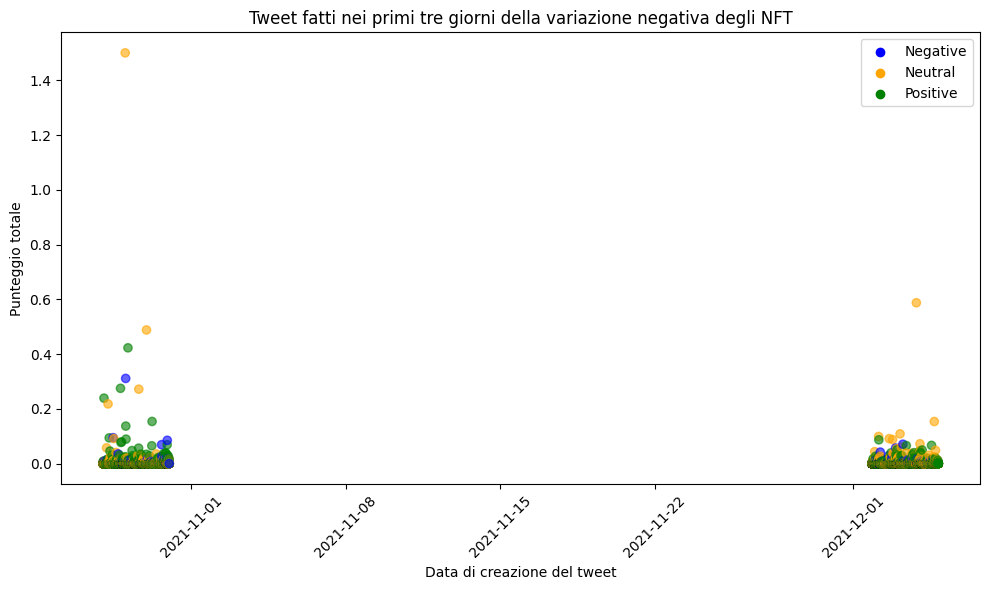

In [42]:
# Preparazione per il filtraggio dei tweet
tweets_nei_primi_tre_giorni_negativi = []

# Iterazione su ciascun picco negativo
for index, row in top_nft_negativi.iterrows():
    data_inizio_variazione = row['data_inizio']
    
    # Filtra i tweet che sono stati fatti nei primi tre giorni dalla data di inizio variazione
    tweets_filtrati_negativi = tweets_sentiment[
        (tweets_sentiment['created_at'] >= data_inizio_variazione) & 
        (tweets_sentiment['created_at'] < data_inizio_variazione + pd.DateOffset(days=3))
    ]
    
    # Aggiungi i tweet filtrati alla lista
    tweets_nei_primi_tre_giorni_negativi.append(tweets_filtrati_negativi)

# Concatena tutti i dataframe di tweet filtrati in uno unico
tweets_nei_primi_tre_giorni_negativi = pd.concat(tweets_nei_primi_tre_giorni_negativi)

# Verifica e gestione dei valori NaN in 'Sentiment'
tweets_nei_primi_tre_giorni_negativi['Sentiment'] = tweets_nei_primi_tre_giorni_negativi['Sentiment'].fillna('neutrale')

# Mappa dei colori in base al sentiment
colori_sentiment_negativi = {
    'Negative': 'blue',
    'Neutral': 'orange',
    'Positive': 'green'
}

# Aggiungi una colonna di colori basata sul sentiment
tweets_nei_primi_tre_giorni_negativi['colori_sentiment'] = tweets_nei_primi_tre_giorni_negativi['Sentiment'].map(colori_sentiment_negativi)

# Grafico dei tweet filtrati in base al punteggio totale con colori basati sul sentiment
plt.figure(figsize=(10, 6))
plt.scatter(tweets_nei_primi_tre_giorni_negativi['created_at'], tweets_nei_primi_tre_giorni_negativi['punteggio_totale'], 
            color=tweets_nei_primi_tre_giorni_negativi['colori_sentiment'], alpha=0.6)
plt.title('Tweet fatti nei primi tre giorni della variazione negativa degli NFT')
plt.xlabel('Data di creazione del tweet')
plt.ylabel('Punteggio totale')
plt.xticks(rotation=45)
# Legenda
handles_negativi = []
labels_negativi = []
for sentiment, color in colori_sentiment_negativi.items():
    handles_negativi.append(plt.scatter([], [], color=color, label=sentiment))
    labels_negativi.append(sentiment)
plt.legend(handles_negativi, labels_negativi, loc='upper right')

plt.tight_layout()
plt.show()


In [43]:
# Iterazione su ciascun picco negativo
for index, row in top_nft_negativi.iterrows():
    data_inizio_variazione = row['data_inizio']
    
    # Filtra i tweet che sono stati fatti nei primi tre giorni dalla data di inizio variazione
    tweets_filtrati = tweets_sentiment[
        (tweets_sentiment['created_at'] >= data_inizio_variazione) & 
        (tweets_sentiment['created_at'] < data_inizio_variazione + pd.DateOffset(days=3))
    ]
    
    # Ordina i tweet filtrati per punteggio totale
    tweets_ordinati = tweets_filtrati.sort_values(by='punteggio_totale', ascending=False)
    
    # Seleziona solo le colonne rilevanti per la tabella
    tweets_da_mostrare = tweets_ordinati[['created_at', 'punteggio_totale', 'Sentiment']]
    
    # Converti la colonna 'created_at' in formato stringa per la visualizzazione
    tweets_da_mostrare['created_at'] = tweets_da_mostrare['created_at'].dt.strftime('%Y-%m-%d %H:%M:%S')
    
    # Rinomina le colonne per una migliore leggibilità
    tweets_da_mostrare.columns = ['Data di creazione', 'Punteggio totale', 'Sentiment']
    
    # Converti il dataframe in una lista di tuple per l'uso con tabulate
    tabella_tweet = tweets_da_mostrare.values.tolist()
    
    # Stampa il titolo del picco negativo
    print(f"\nPicco negativo NFT: {index}")
    
    # Stampa la tabella formattata con tabulate
    print(tabulate(tabella_tweet, headers=['Data di creazione', 'Punteggio totale', 'Sentiment'], tablefmt='pretty'))


/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_8883/3188764803.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tweets_da_mostrare['created_at'] = tweets_da_mostrare['created_at'].dt.strftime('%Y-%m-%d %H:%M:%S')



Picco negativo NFT: 0
+---------------------+------------------------+-----------+
|  Data di creazione  |    Punteggio totale    | Sentiment |
+---------------------+------------------------+-----------+
| 2021-10-28 23:52:50 |   1.5000861561624257   |  Neutral  |
| 2021-10-29 23:02:35 |   0.4879222099031665   |  Neutral  |
| 2021-10-29 02:53:05 |   0.422681195081877    | Positive  |
| 2021-10-29 00:24:08 |   0.3109303934077322   | Negative  |
| 2021-10-28 18:46:09 |   0.2747707973611086   | Positive  |
| 2021-10-29 14:40:35 |   0.2716951736011128   |  Neutral  |
| 2021-10-28 00:47:20 |    0.2389327297152     | Positive  |
| 2021-10-28 05:13:00 |   0.2177750271238629   |  Neutral  |
| 2021-10-30 05:06:48 |   0.1537243264877043   | Positive  |
| 2021-10-29 00:31:10 |   0.1368634751072594   | Positive  |
| 2021-10-28 10:46:27 |   0.0944245240415347   | Negative  |
| 2021-10-28 06:28:31 |   0.0937194954572144   | Positive  |
| 2021-10-28 11:30:39 |   0.0913565543246709   |  Neutral  |
|

/var/folders/ht/ykt5nd_d1w55_nvpcjzwqvmw0000gn/T/ipykernel_8883/3188764803.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tweets_da_mostrare['created_at'] = tweets_da_mostrare['created_at'].dt.strftime('%Y-%m-%d %H:%M:%S')


+---------------------+------------------------+-----------+
|  Data di creazione  |    Punteggio totale    | Sentiment |
+---------------------+------------------------+-----------+
| 2021-12-03 20:35:35 |   0.5873267081256796   |  Neutral  |
| 2021-12-04 16:07:07 |   0.1534745385136913   |  Neutral  |
| 2021-12-03 02:51:29 |   0.1084401774315999   |  Neutral  |
| 2021-12-02 03:31:23 |   0.0989573862289779   |  Neutral  |
| 2021-12-02 15:07:36 |   0.0909522562305037   |  Neutral  |
| 2021-12-02 18:41:29 |   0.0875727510190657   |  Neutral  |
| 2021-12-02 03:47:07 |   0.0865833916218374   | Positive  |
| 2021-12-04 00:32:04 |   0.0721899871062062   |  Neutral  |
| 2021-12-03 05:56:48 |   0.0706950171085907   | Negative  |
| 2021-12-04 13:05:40 |   0.0664535418494216   | Positive  |
| 2021-12-03 09:39:23 |   0.0656752969174191   | Positive  |
| 2021-12-03 04:10:50 |   0.0603626700519552   |  Neutral  |
| 2021-12-02 22:00:01 |   0.0565593562626979   | Negative  |
| 2021-12-02 23:09:11 | 